#  Question 2

#   Amazon Review Sentiment Analysis 

In [1]:
import json
import numpy as np
import pandas as pd
import string 
import re
import spacy
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from wordcloud import WordCloud
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

###    Converting json to csv file 

In [35]:
musical = pd.read_json("Musical_Instruments_5.json",lines=True)
musical.to_csv('musical_instruments.csv','w')
musical.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [36]:
len(musical)

10261

In [37]:
musical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10261 entries, 0 to 10260
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   reviewerID      10261 non-null  object
 1   asin            10261 non-null  object
 2   reviewerName    10234 non-null  object
 3   helpful         10261 non-null  object
 4   reviewText      10261 non-null  object
 5   overall         10261 non-null  int64 
 6   summary         10261 non-null  object
 7   unixReviewTime  10261 non-null  int64 
 8   reviewTime      10261 non-null  object
dtypes: int64(2), object(7)
memory usage: 721.6+ KB


In [38]:
musical.isnull().sum()

reviewerID         0
asin               0
reviewerName      27
helpful            0
reviewText         0
overall            0
summary            0
unixReviewTime     0
reviewTime         0
dtype: int64

####    Reviewname has null values but we are ignoring reviwername since we have reviwerID

In [39]:
len(musical.asin.unique()),len(musical.reviewerName.unique()),len(musical.reviewerID.unique())

(900, 1398, 1429)

###   Converting reviewTime to date format 

In [40]:
musical["reviewTime"] = pd.to_datetime(musical["reviewTime"])

###   Arranging the columns in the dataset

In [41]:
musical = musical[["asin","summary","reviewText","overall","reviewerID","reviewerName","helpful","reviewTime","unixReviewTime"]]

In [42]:
musical.head()

,asin,summary,reviewText,overall,reviewerID,reviewerName,helpful,reviewTime,unixReviewTime
0,1384719342,good,"Not much to write about here, but it does exac...",5,A2IBPI20UZIR0U,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",2014-02-28,1393545600
1,1384719342,Jake,The product does exactly as it should and is q...,5,A14VAT5EAX3D9S,Jake,"[13, 14]",2013-03-16,1363392000
2,1384719342,It Does The Job Well,The primary job of this device is to block the...,5,A195EZSQDW3E21,"Rick Bennette ""Rick Bennette""","[1, 1]",2013-08-28,1377648000
3,1384719342,GOOD WINDSCREEN FOR THE MONEY,Nice windscreen protects my MXL mic and preven...,5,A2C00NNG1ZQQG2,"RustyBill ""Sunday Rocker""","[0, 0]",2014-02-14,1392336000
4,1384719342,No more pops when I record my vocals.,This pop filter is great. It looks and perform...,5,A94QU4C90B1AX,SEAN MASLANKA,"[0, 0]",2014-02-21,1392940800


###   Combining both reviewText and summary as reviewtext

In [43]:
musical["reviewtext"] = musical["reviewText"] + " " + musical["summary"]
musical = musical.drop(["reviewText","summary","reviewerName","helpful","unixReviewTime","reviewTime"],axis=1)
musical

,asin,overall,reviewerID,reviewtext
0,1384719342,5,A2IBPI20UZIR0U,"Not much to write about here, but it does exac..."
1,1384719342,5,A14VAT5EAX3D9S,The product does exactly as it should and is q...
2,1384719342,5,A195EZSQDW3E21,The primary job of this device is to block the...
3,1384719342,5,A2C00NNG1ZQQG2,Nice windscreen protects my MXL mic and preven...
4,1384719342,5,A94QU4C90B1AX,This pop filter is great. It looks and perform...
...,...,...,...,...
10256,B00JBIVXGC,5,A14B2YH83ZXMPP,"Great, just as expected. Thank to all. Five S..."
10257,B00JBIVXGC,5,A1RPTVW5VEOSI,I've been thinking about trying the Nanoweb st...
10258,B00JBIVXGC,4,AWCJ12KBO5VII,I have tried coated strings in the past ( incl...
10259,B00JBIVXGC,4,A2Z7S8B5U4PAKJ,"Well, MADE by Elixir and DEVELOPED with Taylor..."


##   Reviews of the unique products

In [44]:
instruments = musical["overall"].groupby(musical["asin"]).count()
instruments.head(15)

asin
1384719342     5
B00004Y2UT     6
B00005ML71     5
B000068NSX     7
B000068NTU     5
B000068NVI    13
B000068NW5    52
B000068NZC     7
B000068NZG     5
B000068O1N     9
B000068O3D     7
B000068O3X    17
B000068O4H    10
B000068O59     6
B00006LVEU    14
Name: overall, dtype: int64

In [45]:
inst_sort = instruments.sort_values(ascending=False)
inst_sort

asin
B003VWJ2K8    163
B0002E1G5C    143
B0002F7K7Y    116
B003VWKPHC    114
B0002H0A3S     93
             ... 
B004GYM7IE      5
B000LPUV8K      5
B000LAT0AK      5
B004HJ9COU      5
1384719342      5
Name: overall, Length: 900, dtype: int64

###    So, the product B003VWJ2K8(Snark SN-1 Clip-On Guitar and Bass Tuner) has most reviews i.e 163 

###     Visualizing the reviews of unique products

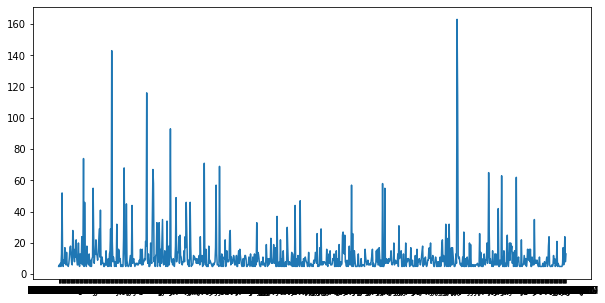

In [46]:
plt.figure(figsize=(10,5))
plt.plot(instruments)

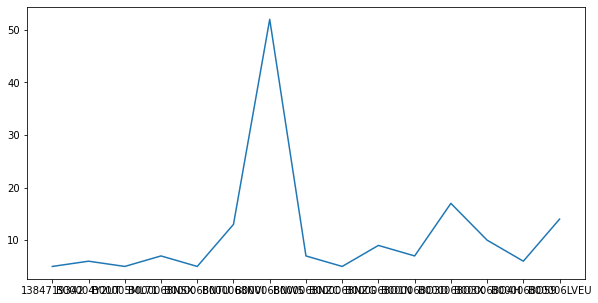

In [47]:
plt.figure(figsize=(10,5))
plt.plot(instruments.head(15))

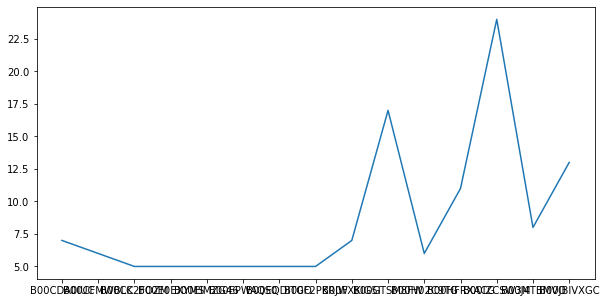

In [48]:
plt.figure(figsize=(10,5))
plt.plot(instruments.tail(15))

##  1)    Finding Sentimental Analysis using given reviews of user 

In [49]:
musical.overall.value_counts()

5    6938
4    2084
3     772
2     250
1     217
Name: overall, dtype: int64

In [50]:
def sentiment_user(user_reviews):
    if user_reviews["overall"] == 4 or user_reviews["overall"] == 5:
        value = "positive"
    elif user_reviews["overall"] == 3:
        value = "neutral"
    elif user_reviews["overall"] == 2 or user_reviews["overall"] == 1:
        value = "negative"
    else:
        value = 0
    return value

In [51]:
musical["sentimental"] = musical.apply(sentiment_user,axis=1)
musical

,asin,overall,reviewerID,reviewtext,sentimental
0,1384719342,5,A2IBPI20UZIR0U,"Not much to write about here, but it does exac...",positive
1,1384719342,5,A14VAT5EAX3D9S,The product does exactly as it should and is q...,positive
2,1384719342,5,A195EZSQDW3E21,The primary job of this device is to block the...,positive
3,1384719342,5,A2C00NNG1ZQQG2,Nice windscreen protects my MXL mic and preven...,positive
4,1384719342,5,A94QU4C90B1AX,This pop filter is great. It looks and perform...,positive
...,...,...,...,...,...
10256,B00JBIVXGC,5,A14B2YH83ZXMPP,"Great, just as expected. Thank to all. Five S...",positive
10257,B00JBIVXGC,5,A1RPTVW5VEOSI,I've been thinking about trying the Nanoweb st...,positive
10258,B00JBIVXGC,4,AWCJ12KBO5VII,I have tried coated strings in the past ( incl...,positive
10259,B00JBIVXGC,4,A2Z7S8B5U4PAKJ,"Well, MADE by Elixir and DEVELOPED with Taylor...",positive


In [52]:
musical.sentimental.value_counts()

positive    9022
neutral      772
negative     467
Name: sentimental, dtype: int64

###    Visualizing the sentimental user reviews

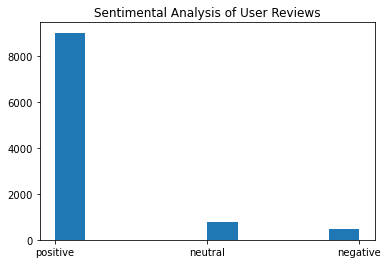

In [53]:
plt.hist(musical["sentimental"])
plt.title('Sentimental Analysis of User Reviews')
plt.show()

###   From the above plot we can say that musical instruments have positive reviews

##  Preprocessing 

In [54]:
from nltk.tokenize import word_tokenize

In [157]:
import nltk
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to C:\Users\ninu
[nltk_data]     pc_2\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\ninu
[nltk_data]     pc_2\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\ninu
[nltk_data]     pc_2\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [56]:
from textblob import TextBlob, Word

In [57]:
mus_ins = pd.DataFrame(musical["reviewtext"])
mus_ins

,reviewtext
0,"Not much to write about here, but it does exac..."
1,The product does exactly as it should and is q...
2,The primary job of this device is to block the...
3,Nice windscreen protects my MXL mic and preven...
4,This pop filter is great. It looks and perform...
...,...
10256,"Great, just as expected. Thank to all. Five S..."
10257,I've been thinking about trying the Nanoweb st...
10258,I have tried coated strings in the past ( incl...
10259,"Well, MADE by Elixir and DEVELOPED with Taylor..."


In [58]:
mus_ins.reviewtext[0]

"Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing, good"

In [59]:
def clean_text(text):
    text = text.lower()                                                       # lower case
    text = re.sub(r"\S*https?:\S*", "", text)                                 # removing links
    text = re.sub('\[.*?\]', '', text)                                        # removing text in square brackets
    text = re.sub(r"[’…]", "", text)                                          # removing special chracters
    text = text.translate(str.maketrans('', '', string.punctuation))          # remove punctuations 
    text_tokens = word_tokenize(text)                                         # Tokenization
    stop_words = stopwords.words('english')
    stop_tokens = [word for word in text_tokens if not word in stop_words]    # Remove stop words
    stop_text = ' '.join(stop_tokens)
    lemmas = TextBlob(stop_text)         
    lemmas_token = [w.lemmatize() for w in lemmas.words]                      # Lemmatization
    lemmas_text = ' '.join(lemmas_token)
    return lemmas_text
clean = lambda x: clean_text(x)

In [60]:
mus_ins["Text"] = mus_ins["reviewtext"].apply(clean)

In [61]:
mus_ins

,reviewtext,Text
0,"Not much to write about here, but it does exac...",much write exactly supposed filter pop sound r...
1,The product does exactly as it should and is q...,product exactly quite affordablei realized dou...
2,The primary job of this device is to block the...,primary job device block breath would otherwis...
3,Nice windscreen protects my MXL mic and preven...,nice windscreen protects mxl mic prevents pop ...
4,This pop filter is great. It looks and perform...,pop filter great look performs like studio fil...
...,...,...
10256,"Great, just as expected. Thank to all. Five S...",great expected thank five star
10257,I've been thinking about trying the Nanoweb st...,ive thinking trying nanoweb string bit put hig...
10258,I have tried coated strings in the past ( incl...,tried coated string past including elixir neve...
10259,"Well, MADE by Elixir and DEVELOPED with Taylor...",well made elixir developed taylor guitar strin...


In [63]:
mus_ins.Text[0]

'much write exactly supposed filter pop sound recording much crisp one lowest price pop filter amazon might well buy honestly work despite pricing good'

###   List to string 

In [64]:
Text = ",".join(mus_ins.Text)
Text

'much write exactly supposed filter pop sound recording much crisp one lowest price pop filter amazon might well buy honestly work despite pricing good,product exactly quite affordablei realized double screened arrived even better expectedas added bonus one screen carry small hint smell old grape candy used buy reminiscents sake stop putting pop filter next nose smelling recording dif needed pop filter work well expensive one may even come pleasing aroma like mine didbuy product jake,primary job device block breath would otherwise produce popping sound allowing voice pas noticeable reduction volume high frequency double cloth filter block pop let voice coloration metal clamp mount attache mike stand secure enough keep attached goose neck need little coaxing stay put job well,nice windscreen protects mxl mic prevents pop thing gooseneck marginally able hold screen position requires careful positioning clamp avoid sagging good windscreen money,pop filter great look performs like studio f

In [65]:
len(Text)

3276436

##   2)  Sentimental Analysis using Polarity 

In [71]:
mus_ins['polarity'] = mus_ins['Text'].map(lambda text: TextBlob(text).sentiment.polarity)
mus_ins['Text_len'] = mus_ins['Text'].astype(str).apply(len)
mus_ins['word_count'] = mus_ins['Text'].apply(lambda x: len(str(x).split()))

In [72]:
mus_ins['sentiment']=''
mus_ins.loc[mus_ins.polarity>0,'sentiment']='positive'
mus_ins.loc[mus_ins.polarity==0,'sentiment']='neutral'
mus_ins.loc[mus_ins.polarity<0,'sentiment']='negative'

In [73]:
mus_ins 

,reviewtext,Text,polarity,Text_len,word_count,sentiment
0,"Not much to write about here, but it does exac...",much write exactly supposed filter pop sound r...,0.400000,150,24,positive
1,The product does exactly as it should and is q...,product exactly quite affordablei realized dou...,0.014286,336,52,positive
2,The primary job of this device is to block the...,primary job device block breath would otherwis...,0.167500,296,45,positive
3,Nice windscreen protects my MXL mic and preven...,nice windscreen protects mxl mic prevents pop ...,0.425000,169,23,positive
4,This pop filter is great. It looks and perform...,pop filter great look performs like studio fil...,0.800000,120,19,positive
...,...,...,...,...,...,...
10256,"Great, just as expected. Thank to all. Five S...",great expected thank five star,0.350000,30,5,positive
10257,I've been thinking about trying the Nanoweb st...,ive thinking trying nanoweb string bit put hig...,0.179718,1853,291,positive
10258,I have tried coated strings in the past ( incl...,tried coated string past including elixir neve...,0.247449,348,54,positive
10259,"Well, MADE by Elixir and DEVELOPED with Taylor...",well made elixir developed taylor guitar strin...,0.177974,985,152,positive


In [74]:
mus_ins.describe()

,polarity,Text_len,word_count
count,10261.000000,10261.000000,10261.000000
mean,0.291154,318.309716,49.149985
std,0.199747,390.201995,58.519606
min,-0.800000,12.000000,2.000000
25%,0.165747,117.000000,19.000000
50%,0.276389,192.000000,30.000000
75%,0.408333,356.000000,56.000000
max,1.000000,7385.000000,1117.000000


###    Visualizing the Sentimental Analysis 

Text(0.5, 1.0, 'Sentiment Polarity Distribution')

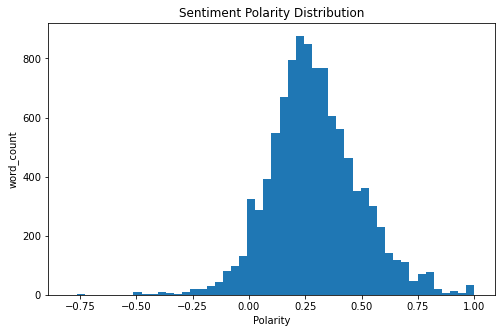

In [75]:
plt.figure(figsize=(8,5))
mus_ins['polarity'].plot( kind='hist',bins=50)
plt.xlabel("Polarity")
plt.ylabel("word_count")
plt.title("Sentiment Polarity Distribution")

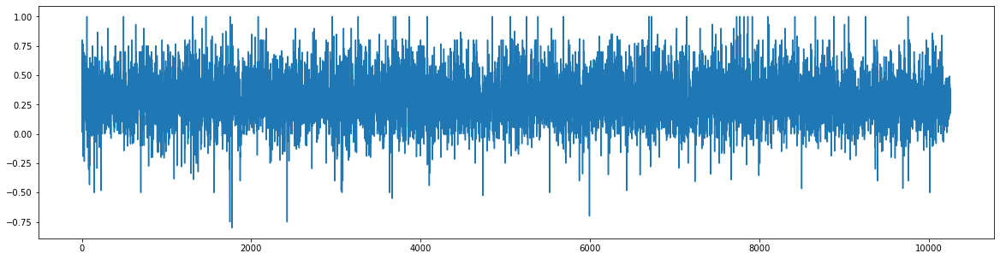

In [160]:
plt.figure(figsize=(20,5))
plt.plot(mus_ins['polarity']) 

###   From this we can say that musical instruments have more positive reviews when compared to negative reviews 

Text(0, 0.5, 'word_count')

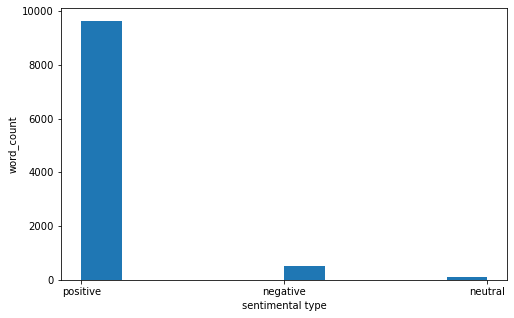

In [77]:
plt.figure(figsize=(8,5))
plt.hist( mus_ins["sentiment"])
plt.xlabel("sentimental type")
plt.ylabel("word_count")

###   Here, we have large number of positive reviews 

Text(0, 0.5, 'word_count')

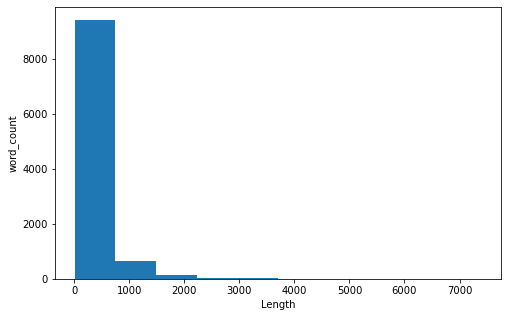

In [78]:
plt.figure(figsize=(8,5))
plt.hist( mus_ins["Text_len"])
plt.xlabel("Length")
plt.ylabel("word_count")

###  most of length falls between 0 to 1000

##  3) Emotion Mining Using Rule Based Approach

In [115]:
positive = pd.read_csv("positive-words.txt",encoding='cp1252',error_bad_lines=False,sep='\n',header=None)
positive

,0
0,;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;...
1,;
2,; Opinion Lexicon: Positive
3,;
4,; This file contains a list of POSITIVE opinio...
...,...
2035,youthful
2036,zeal
2037,zenith
2038,zest


In [116]:
positive = positive.drop(labels=range(0,35),axis=0).reset_index(drop=True)

In [117]:
positive["values"] = 1
positive

,0,values
0,abound,1
1,abounds,1
2,abundance,1
3,abundant,1
4,accessable,1
...,...,...
2000,youthful,1
2001,zeal,1
2002,zenith,1
2003,zest,1


In [118]:
negative = pd.read_csv("negative-words.txt",encoding='cp1252',header=None,error_bad_lines=False,sep="\n")

In [119]:
negative["values"] = -1
negative

,0,values
0,abnormal,-1
1,abolish,-1
2,abominable,-1
3,abominably,-1
4,abominate,-1
...,...,...
4776,zaps,-1
4777,zealot,-1
4778,zealous,-1
4779,zealously,-1


In [120]:
stop_text = pd.read_csv("stop.txt",encoding='cp1252',header=None,error_bad_lines=False,sep="\n")
stop = stop_text[0].tolist()

In [121]:
musical_inst

,reviewtext,Text
0,"Not much to write about here, but it does exac...",much write exactly supposed filter pop sound r...
1,The product does exactly as it should and is q...,product exactly quite affordablei realized dou...
2,The primary job of this device is to block the...,primary job device block breath would otherwis...
3,Nice windscreen protects my MXL mic and preven...,nice windscreen protects mxl mic prevents pop ...
4,This pop filter is great. It looks and perform...,pop filter great look performs like studio fil...
...,...,...
10256,"Great, just as expected. Thank to all. Five S...",great expected thank five star
10257,I've been thinking about trying the Nanoweb st...,ive thinking trying nanoweb string bit put hig...
10258,I have tried coated strings in the past ( incl...,tried coated string past including elixir neve...
10259,"Well, MADE by Elixir and DEVELOPED with Taylor...",well made elixir developed taylor guitar strin...


In [136]:
Text

'much write exactly supposed filter pop sound recording much crisp one lowest price pop filter amazon might well buy honestly work despite pricing good,product exactly quite affordablei realized double screened arrived even better expectedas added bonus one screen carry small hint smell old grape candy used buy reminiscents sake stop putting pop filter next nose smelling recording dif needed pop filter work well expensive one may even come pleasing aroma like mine didbuy product jake,primary job device block breath would otherwise produce popping sound allowing voice pas noticeable reduction volume high frequency double cloth filter block pop let voice coloration metal clamp mount attache mike stand secure enough keep attached goose neck need little coaxing stay put job well,nice windscreen protects mxl mic prevents pop thing gooseneck marginally able hold screen position requires careful positioning clamp avoid sagging good windscreen money,pop filter great look performs like studio f

###    WordCloud

In [137]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off"); 

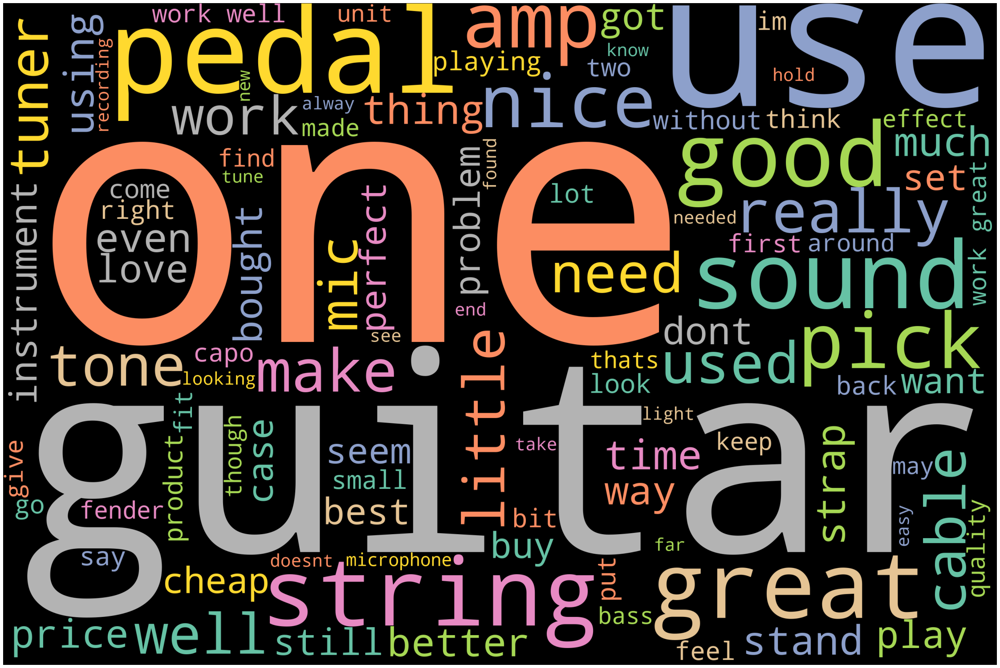

In [138]:
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black',
                      max_words=100,colormap='Set2').generate(Text)
plot_cloud(wordcloud)

###   Positive WordCloud

In [141]:
positive_word = " ".join(positive[0]).split()
pos_word = " ".join(w for w in Text.split() if w in positive_word)

In [142]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off"); 

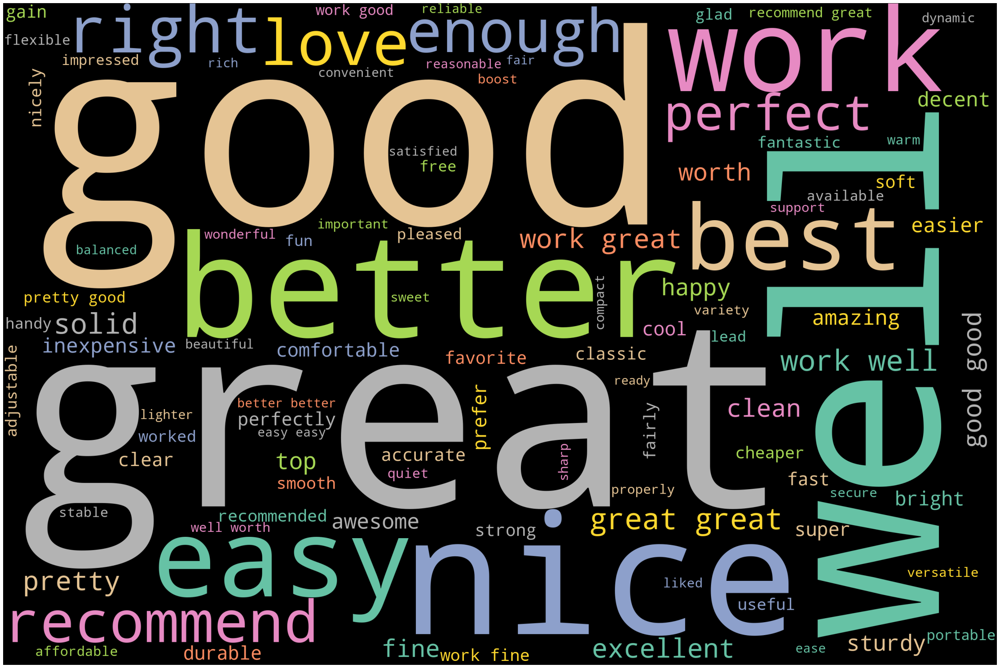

In [143]:
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black', 
                      max_words=100,colormap='Set2').generate(pos_word)
plot_cloud(wordcloud)

###   Negative WordCloud

In [144]:
negative_word = " ".join(negative[0]).split()
neg_word = " ".join(word for word in Text.split() if word in negative_word)

In [145]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off"); 

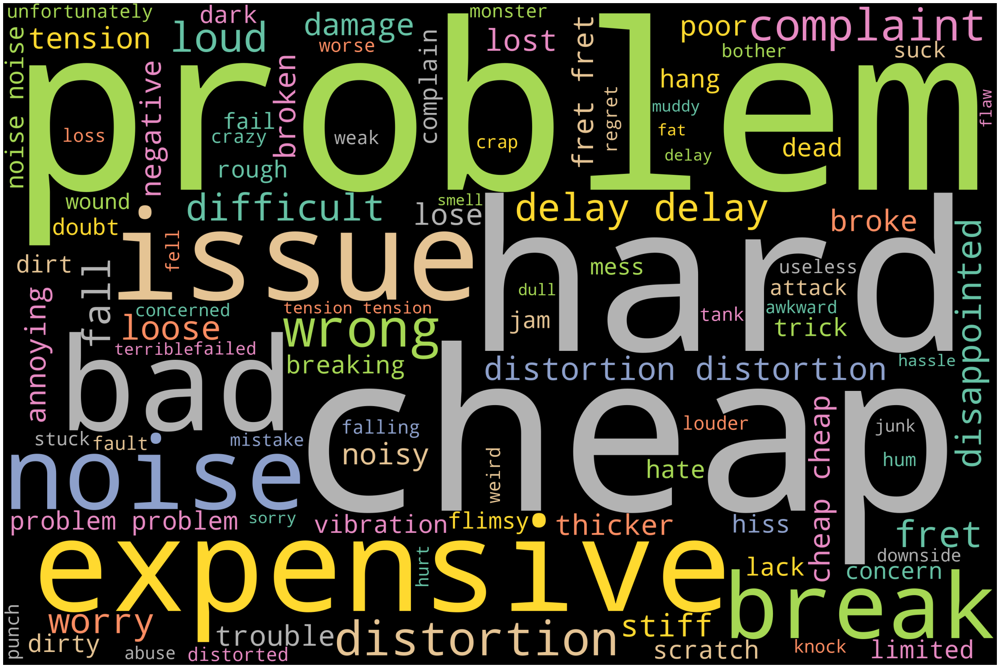

In [153]:
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black',
                      max_words=100,colormap='Set2').generate(neg_word)
plot_cloud(wordcloud)

###   Percentage of positive and negative words

In [154]:
len(pos_word), len(neg_word), len(Text.split())

(389291, 144295, 494068)

In [155]:
len(pos_word)/len(Text.split())

0.7879300015382498

In [156]:
len(neg_word)/len(Text.split())

0.2920549398058567

In [ ]:
###   From the above analysis, we can see that amazon reviews for musical instruments are positive 